## EDA

In [11]:
!pip install pyarrow

  Using cached pyarrow-16.1.0-cp310-cp310-win_amd64.whl (25.9 MB)


You should consider upgrading via the 'D:\digital_avatar\env\Scripts\python.exe -m pip install --upgrade pip' command.


In [13]:
import os
import pickle
from tqdm import tqdm
from glob import glob

from dataclasses import dataclass

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
@dataclass
class Config:
    o1_m2_folder = 'data/01-m2'
    o2_m1_folder = 'data/02-m1'
    night_metrcs = 'data/datasetnight_metrics.pkl'

config = Config()

## Read sleep signal

In [8]:
with open(config.night_metrcs, 'rb') as f:
    metrics = pickle.load(f)

sleep_df  = {'n_user': [], 'type': [], 'n_exp': [], 'signal': []}
for x in metrics:
    sleep_df['n_user'].append(x['user'])
    sleep_df['type'].append(x['type'])
    sleep_df['n_exp'].append(x['exp'])
    sleep_df['signal'].append(x['values'])

sleep_df = pd.DataFrame.from_dict(sleep_df)    

In [12]:
sleep_df.to_parquet('data_sleep.parquet')

## EDA sleep data

In [22]:
def print_time_series(df):
    
    df_exploded = df.explode('signal').reset_index(drop=True)
    df_exploded['time'] = df_exploded.groupby(['n_user', 'n_exp']).cumcount()

    users = df['n_user'].unique()
    
    fig, axes = plt.subplots(len(users), 1, figsize=(20, 6 * len(users)), sharex=True, sharey=True)
    
    if len(users) == 1:
        axes = [axes]
    
    for ax, user in zip(axes, users):
        user_data = df_exploded[df_exploded['n_user'] == user]
        sns.lineplot(data=user_data, x='time', y='signal', hue='n_exp', ax=ax, markers=True, dashes=False)
        ax.set_title(f'User {user}')
        ax.set_xlabel('Time')
        ax.set_ylabel('Signal Value')
        ax.legend(title='Experiment')

    plt.tight_layout()
    plt.show()


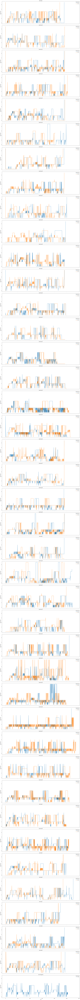

In [23]:
print_time_series(sleep_df)

## Read user info data

In [32]:
user_info = pd.read_excel('user_info.xlsx')
user_info['num_patient'] = user_info['num_patient'].apply(lambda x: f'Np {x}')
user_info['num_exp'] = user_info['num_exp'].apply(lambda x: f'Nr {x}')
user_info = user_info.rename(columns={'num_patient': 'n_user', 'num_exp': 'n_exp'})
user_info.head(3)

,n_user,age,gender,height,weight,pulse,bp_upper,bp_lower,n_exp,ODI,target,num_apnee,num_hypeapnea,AI,HI,AHI
0,Np 1,51,M,164,60.0,80,95,60,Nr 1,0.0,0,0,0,0.0,0.0,0.0
1,Np 1,51,M,164,60.0,80,95,60,Nr 2,0.3,0,0,0,0.0,0.0,0.0
2,Np 2,22,M,174,66.0,50,110,70,Nr 1,0.2,0,0,0,0.0,0.0,0.0


In [50]:
user_info.shape, sleep_df.shape

((80, 16), (80, 4))

In [29]:
sleep_df.head(2)

,n_user,type,n_exp,signal
0,Np 1,night_metrics,Nr 1,"[9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,Np 1,night_metrics,Nr 2,"[9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [48]:
sleep_df = sleep_df[~(sleep_df['n_user'] == 'Programs')]

In [55]:
sleep_info_df = sleep_df.merge(user_info, on=['n_user', 'n_exp'])

## EDA sleep_info_df

In [72]:
def print_time_series(df):
    df_exploded = df.explode('signal').reset_index(drop=True)
    
    df_exploded['time'] = df_exploded.groupby(['n_user', 'n_exp']).cumcount()

    # Split the data into healthy and not healthy groups
    healthy = df_exploded[df_exploded['target'] == 0]
    not_healthy = df_exploded[df_exploded['target'] == 1]

    # Create subplots
    fig, axes = plt.subplots(20, 2, figsize=(60, 300), sharex=True, sharey=True)

    id_healthy = healthy['n_user'].unique()
    for i, (ax_left, ax_right) in enumerate(tqdm(axes)):
        if i < 40:
            user_id_healthy = id_healthy[i]
            user_data_healthy = healthy[healthy['n_user'] == user_id_healthy]
            sns.lineplot(data=user_data_healthy, x='time', y='signal', ax=ax_left,  hue='n_exp', color='green', markers=True, dashes=False)
            ax_left.set_title(f'Healthy User {user_id_healthy}')
            ax_left.set_xlabel('Time')
            ax_left.set_ylabel('Signal Value')
            ax_left.legend().set_visible(False)
            ax_left.legend(title='Experiment')

            user_id_not_healthy = not_healthy['n_user'].unique()[i]
            user_data_not_healthy = not_healthy[not_healthy['n_user'] == user_id_not_healthy]
            sns.lineplot(data=user_data_not_healthy, x='time', y='signal', hue='n_exp', ax=ax_right, palette=['r', 'g'], markers=True, dashes=False)
            ax_right.set_title(f'Not Healthy User {user_id_not_healthy}')
            ax_right.set_xlabel('Time')
            ax_right.set_ylabel('Signal Value')
            ax_right.legend().set_visible(False)

    plt.tight_layout()
    plt.show()


In [73]:
print_time_series(sleep_info_df)

100%|██████████| 20/20 [00:02<00:00,  8.99it/s]


In [75]:
sleep_info_df.to_parquet('sleep_target.parquet')

In [76]:
sleep_info_df.head(1)

,n_user,type,n_exp,signal,age,gender,height,weight,pulse,bp_upper,bp_lower,ODI,target,num_apnee,num_hypeapnea,AI,HI,AHI
0,Np 1,night_metrics,Nr 1,"[9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",51,M,164,60.0,80,95,60,0.0,0,0,0,0.0,0.0,0.0
